# Unsupervised Satellite Image Segmentation Via Silhouette Score Optimized K Means Clustering
## Surya Keswani
### sukeswan@ucsc.edu
This notebook segments a folder of images using the K Means Clustering algorithms. Each image's k value is optimized using a Silhouette Score. To learn more about the reasons for these decisions, refer to the corresponding report. 

To run this script, download the images and save them locally. Copy and path to the image folder and input into the main function call. 

Note: To run this script, all the corresponding libraries below must be installed and properly running. I reccomend creating a virtual envirnoment using Anaoconda. 

In [1]:
import numpy as np                                                                    # import libraries needed for segmentation
import cv2
import matplotlib.pyplot as plt
import copy
import os
import glob
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

print("All libraries imported.")

All libraries imported.


In [2]:
def read_images(PATH):                                                      # read images in folder specified via path to folder
    
    images = [] # array where images are stored
    data_path = os.path.join(PATH,'*g')                                     # data path to access images
    files = glob.glob(data_path)                                            # files in data path
    
    for f1 in files:                                                        # iterate through reading images
        img = cv2.imread(f1)
        images.append(img)
                                                                            # Comment below test code
    return images                                                   

print("read_images function compiled.")

read_images function compiled.


In [3]:
def silho_score(image):
    image_copy = copy.deepcopy(image)
    
    # image_copy = np.array(image_copy, dtype = np.float64) /255
    # w, h, d = original_shape = tuple(image_copy.shape)
    # assert d == 3                                                       # print(image_copy.shape)
    # image_copy = np.reshape(image_copy, (w*h,d))
    
    #print("The dim of the image is: ", image_copy.ndim)
    #print(image_copy.shape)
    #print(image_copy)
    
    cluster_values = list(range(2,10))                               # optimize for K between 2 and 10
    scores = []
    for clus_val in cluster_values:
        clusterer = KMeans(n_clusters = clus_val, random_state = 10) # initialize clusterer with cluster value and random generator seed of 10 for reproducibilty
        cluster_labels = clusterer.fit_predict(image_copy)           # fit the image based on the clusterer
        silhouette_avg = silhouette_score(image_copy, cluster_labels)# get avg silhouette score 
        scores.append(silhouette_avg)                                # append score 
    K = (scores.index(max(scores))) + 2                              # K will be the index + 2 of the  highest silhouette score
    print(K)
    return K
print("silhouette_score function compiled.")

silhouette_score function compiled.


In [4]:
def process_image(image):                                                                    # process image
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)                                            # convert image to HSV Space to see it in RGB 
    vectorized = image.reshape((-1,3))                                                       # reshape image so each row is a vector in 3d space of RGB (Color Quantization)
    vectorized = np.float32(vectorized)                                                      # convert uint8 to floats
    return image, vectorized
print("process_image function compiled.")

process_image function compiled.


In [5]:
def k_means(image, vectorized, K):
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)                 # iteration termination criteria for k means clustering, (type, max_iter, epsilon)
    attempts=10                                                                              # number of times algo is executed using diff intial labels, returns best compactness of clusters 
    ret,label,center = cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS) # k means returns compactness of clusters, labels, and centers of clusters
    center = np.uint8(center)                                                                # convert centers back to uint8
    return image,label,center

In [6]:
def show_image(image,label,center,K):                                   # show the resulting clustered image
    res = center[label.flatten()]                                       # regenerate clustered image (revert color quantization)
    result_image = res.reshape((image.shape))                           # result image 

    figure_size = 15

    plt.figure(figsize=(figure_size,figure_size))                       # show original image
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])

    plt.subplot(1,2,2)                                                  # show clustered image
    plt.imshow(result_image)
    plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
    plt.show()

print("show_image function compiled.")

show_image function compiled.


In [7]:
def auto_canny_edge_detection(image, sigma):        
  v = np.median(image)                              # CANNY EDGE DETECTION not working very well so thats scrapped
                                                    # lower sigma is tighter threshold and higher sigma is wider threshold
  lower = 100 #int(max(0, (1.0 - sigma) * v))            # zero parameter auto canny edge detection 
  upper = 200 #int(min(255, (1.0 + sigma) * v))          # CED is probably not working because there are too many detailed edges ... 
  figure_size = 15                                  # ... and it is tricky to highlight a single object like a road or any ... 
  edges = cv2.Canny(image,lower,upper)              # ... other features                                           
  plt.figure(figsize=(figure_size,figure_size))
  plt.subplot(1,2,1)
  plt.imshow(image)
  plt.title('Original Image'), plt.xticks([]), plt.yticks([])

  plt.subplot(1,2,2)
  plt.imshow(edges,cmap = 'gray')
  plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
  plt.show()
  print(lower, upper)
print("auto_canny_edge_detection function compiled.")

auto_canny_edge_detection function compiled.


In [8]:
def canny_main(PATH):                               # main function to run canny edge detection
    images = read_images(PATH)                      # Test file Path:  "/Users/sukeswan/Desktop/sat_images" 
    for the_image in images:
        
        image, vectorized = process_image(the_image)
        auto_canny_edge_detection(image, 0.33)

In [9]:
def main(PATH):                                     # main function executes clustering; requires file path as input
    images = read_images(PATH)                      # Test file Path:  "/Users/sukeswan/Desktop/sat_images" 
    for the_image in images:
        
        image, vectorized = process_image(the_image)
        K = 4 #silho_score(vectorized)              # to run sihlo score uncomment out the function call 
        image,label,center = k_means(image, vectorized, K)
        show_image(image,label,center,K)

print("main function compiled.")

main function compiled.


In [10]:
def many_k_main(PATH):                              # same exact thing as main function except clusters each image for multiple K values
    images = read_images(PATH)                       
    k_vals = (2,4,6,8,10)
    for the_image in images:
        for K in k_vals:
            image, vectorized = process_image(the_image)
            image,label,center = k_means(image, vectorized, K)
            show_image(image,label,center,K)

print("many_k_main function compiled.")

many_k_main function compiled.


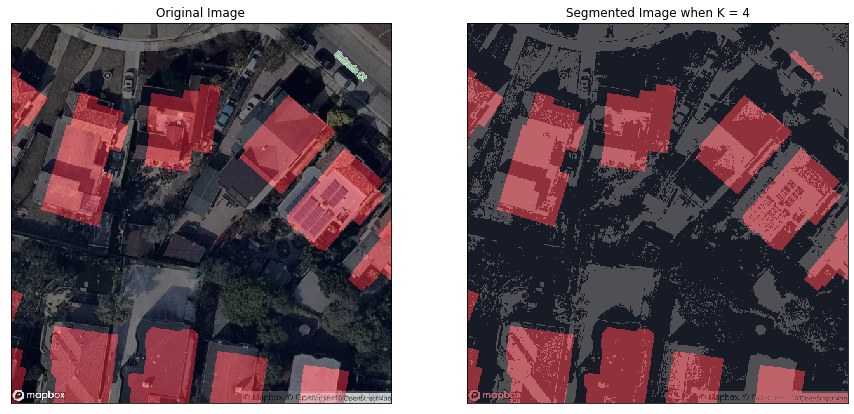

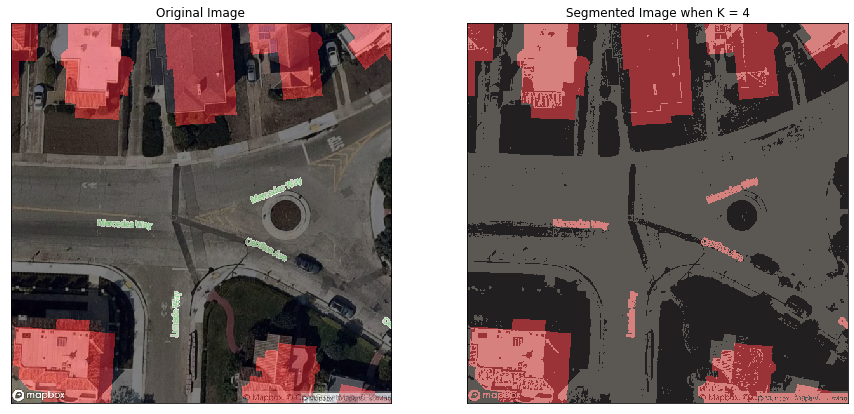

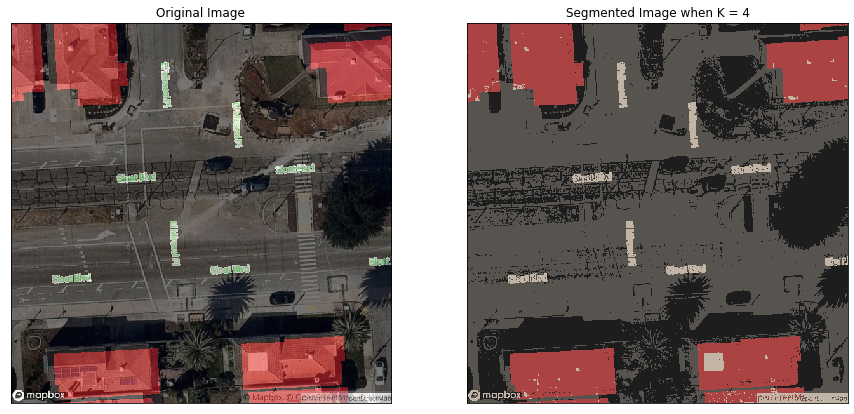

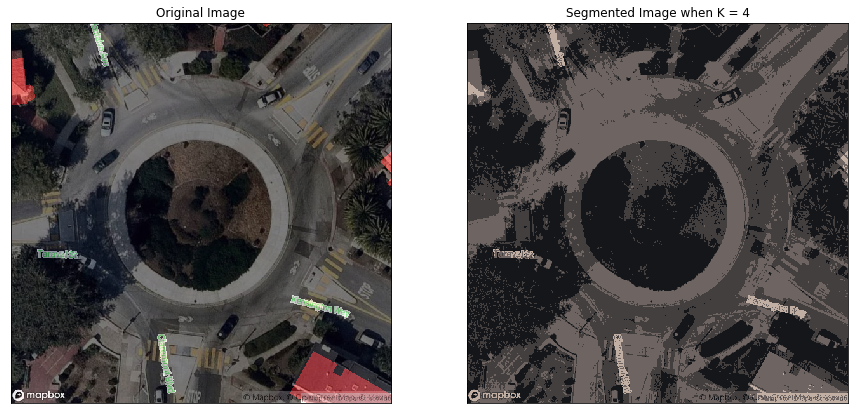

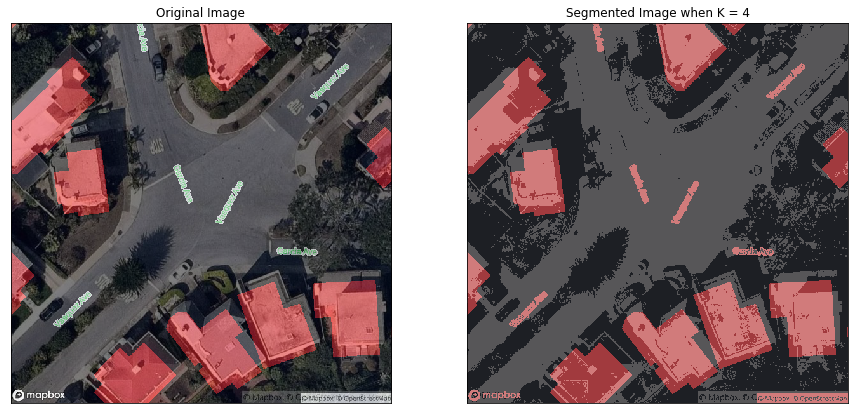

...

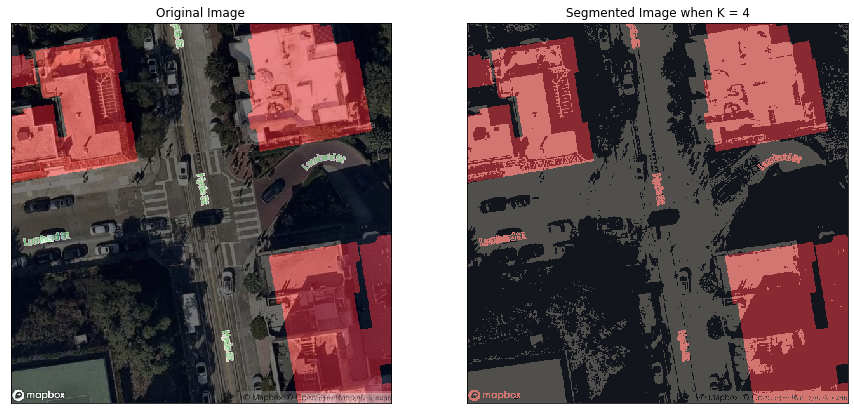

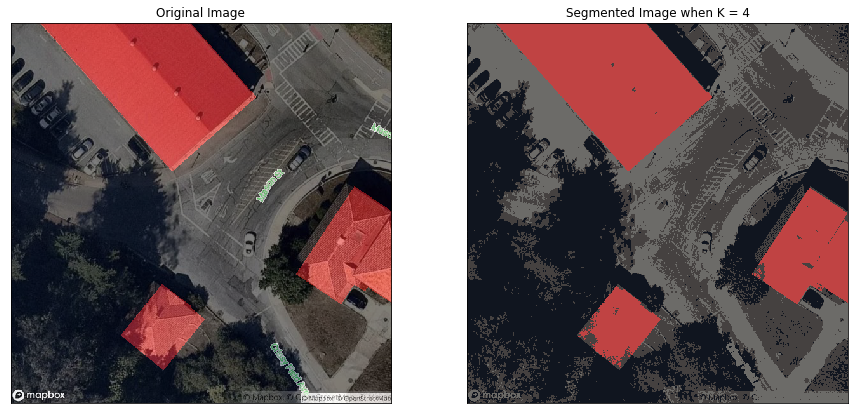

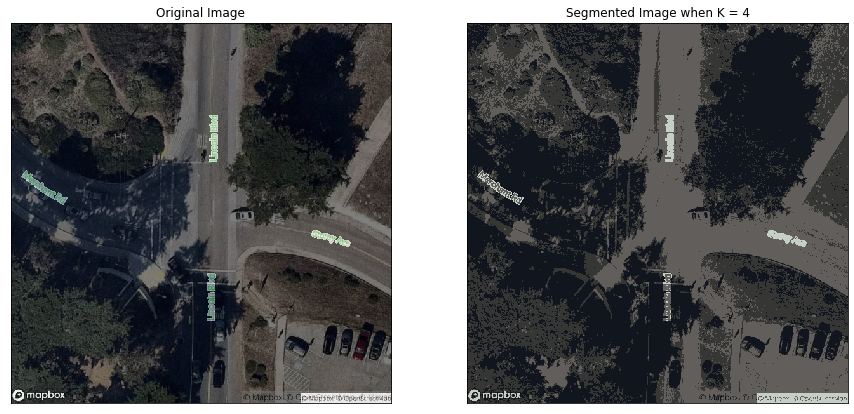

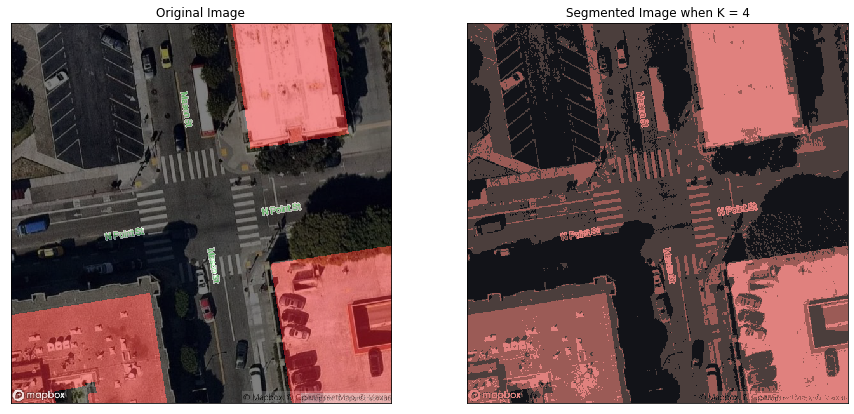

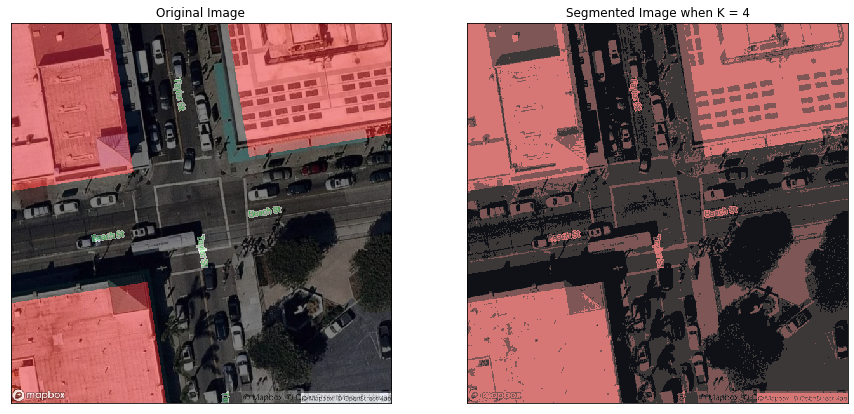

Clustering Image Segmentation Notebook Completed.


In [11]:
main("/Users/sukeswan/Desktop/test-images/")
print("Clustering Image Segmentation Notebook Completed.")